# Nutrieasy Model - Capstone Product Track | C241-PS072 Team

### Fruit and Vegetable Classification using Xception Model

**Our Team** :

|Name|Bangkit Student ID|Path|
|-|-|-|
|Vristian Vlasdityo Vithun Chandra|A505D4KY3535|Mobile Development|
|Gibran Shevaldo|A012D4KY4382|Mobile Development|
|Resa Suhendra|C193D4KY0809|Cloud Computing|
|Bagus Prayogi|C004D4KY0908|Cloud Computing|
|Kezia Natalia|M319D4KX1450|Machine Learning|
|Steven Harianto|M505D4KY2938|Machine Learning|
|Valentino Rocky Atmojo|M505D4KY2155|Machine Learning|

<a id="import libraries"></a>
<h2><b><span style="color:#005f26">🔶 Step 1 | </span><span style="color:#ff6200">Import Libraries</span></b></h2>

In [80]:
import os
import zipfile
import json
import shutil
import tensorflow as tf
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from google.colab import files
from tensorflow.keras import utils

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.xception import preprocess_input
from keras.models import load_model
from keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import plot_model

<a id="preprocessing"></a>
<h2><b><span style="color:#005f26">🔶 Step 2 | </span><span style="color:#ff6200">Data Preprocessing</span></b></h2>

<a id="formatting"></a>
<h2><b><span style="color:#005f26">2.1 | </span><span style="color:#ff6200">Data Formatting</span></b></h2>

<a id="import"></a>
<h3><b><span style="color:#005f26">2.1.1 | </span><span style="color:#ff6200">Importing Data</span></b></h3>

In [ ]:
# download dataset dari kaggle
!kaggle datasets download -d keycia/fruit-nutrionix
!kaggle datasets download -d keycia/vegetables-nutrionix

Dataset URL: https://www.kaggle.com/datasets/keycia/fruit-nutrionix
License(s): unknown
100% 944M/945M [00:54<00:00, 16.2MB/s]
100% 945M/945M [00:54<00:00, 18.1MB/s]
Dataset URL: https://www.kaggle.com/datasets/keycia/vegetables-nutrionix
License(s): unknown
100% 1.63G/1.63G [01:35<00:00, 16.5MB/s]
100% 1.63G/1.63G [01:35<00:00, 18.3MB/s]


In [ ]:
# Extract zip files
with zipfile.ZipFile('./fruit-nutrionix.zip') as zipref:
    zipref.extractall('./fruit_data')

In [ ]:
# Extract zip files
with zipfile.ZipFile('./vegetables-nutrionix.zip') as zipref:
    zipref.extractall('./vegetable_data')

In [ ]:
data_dir = "./fv_dataset"
fruit = "/content/fruit_data/fruit_dataset"
vegetables = "/content/vegetable_data"

<a id="split data"></a>
<h3><b><span style="color:#005f26">2.1.2 | </span><span style="color:#ff6200">Split Data</span></b></h3>

In [ ]:
def split_dataset(original_dir, base_dir):
    class_names = os.listdir(original_dir)
    if not class_names:
        print(f"No directories found in {original_dir}")
        return

    for class_name in class_names:
        class_dir = os.path.join(original_dir, class_name)
        if not os.path.isdir(class_dir):
            continue

        print(f"Processing class: {class_name}")

        # Create a subfolder for each class in dataset_split
        os.makedirs(os.path.join(base_dir, 'train', class_name), exist_ok=True)
        os.makedirs(os.path.join(base_dir, 'val', class_name), exist_ok=True)
        os.makedirs(os.path.join(base_dir, 'test', class_name), exist_ok=True)

        # Split the dataset into train (60%), val (20%), test (20%) per class
        files = os.listdir(class_dir)
        if not files:
            print(f"No files found in {class_dir}")
            continue

        train_files, test_files = train_test_split(files, test_size=0.2, random_state=42)
        train_files, val_files = train_test_split(train_files, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

        # Move the images into the appropriate folders in dataset_split
        for file in train_files:
            os.rename(os.path.join(class_dir, file),
                      os.path.join(base_dir, 'train', class_name, file))
        for file in val_files:
            os.rename(os.path.join(class_dir, file),
                      os.path.join(base_dir, 'val', class_name, file))
        for file in test_files:
            os.rename(os.path.join(class_dir, file),
                      os.path.join(base_dir, 'test', class_name, file))

In [ ]:
# Split data into train, test, validation
split_dataset(fruit, data_dir)
split_dataset(vegetables, data_dir)

Processing class: peach
Processing class: fig
Processing class: grapefruit
Processing class: passion fruit
Processing class: peanut
Processing class: banana
Processing class: tamarillo
Processing class: kiwi
Processing class: orange
Processing class: cherry
Processing class: macadamia
Processing class: brazil nuts
Processing class: carambola
Processing class: blueberry
Processing class: durian
Processing class: strawberry
Processing class: guava
Processing class: pomegranate
Processing class: lemon
Processing class: tangelo
Processing class: pineapple
Processing class: cashews
Processing class: mango
Processing class: dragon fruit
Processing class: almonds
Processing class: pecans
Processing class: dates
Processing class: lychee
Processing class: grape
Processing class: rambutan
Processing class: limes
Processing class: avocado
Processing class: cantaloupe
Processing class: kumquats
Processing class: coconut
Processing class: mangostan
Processing class: watermelon
Processing class: apr

In [ ]:
train_data_dir = "/content/fv_dataset/train"
validation_data_dir = "/content/fv_dataset/val"
test_data_dir = "/content/fv_dataset/test"

<a id="augmentation"></a>
<h2><b><span style="color:#005f26">2.2 | </span><span style="color:#ff6200">Image Data Augmentation</span></b></h2>

In [ ]:
# Image augmentation using ImageDataGenerator
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)
validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

In [ ]:
# Iterators for train, val, and test data
train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(300, 300),
        batch_size=128,
        class_mode='categorical')

validation_generator = validation_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(300, 300),
        batch_size=32,
        class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
        test_data_dir,
        target_size=(300, 300),
        batch_size=32,
        class_mode='categorical')

Found 40723 images belonging to 66 classes.
Found 13583 images belonging to 66 classes.
Found 13585 images belonging to 66 classes.


In [ ]:
# initialize many classes
num_class = len(train_generator.class_indices.keys())
print("num_class: ", num_class)
train_generator.class_indices.keys()

num_class:  66


dict_keys(['Broccoli', 'Cauliflower', 'almonds', 'apple', 'apricot', 'avocado', 'banana', 'blueberry', 'brazil nuts', 'cabbage', 'cantaloupe', 'carambola', 'carrot', 'cashews', 'cherry', 'chili', 'clementine', 'coconut', 'corn', 'cucumber', 'dates', 'dragon fruit', 'durian', 'eggplant', 'fig', 'galangal', 'garlic', 'ginger', 'grape', 'grapefruit', 'guava', 'hazelnut', 'kiwi', 'kumquats', 'lemon', 'lettuce', 'limes', 'long bean', 'lychee', 'macadamia', 'mango', 'mangostan', 'onion', 'onion red', 'orange', 'papaya', 'passion fruit', 'peach', 'peanut', 'pear', 'peas', 'pecans', 'pineapple', 'pomegranate', 'potato', 'pumpkin', 'radish', 'rambutan', 'raspberry', 'spinach', 'strawberry', 'sweet potato', 'tamarillo', 'tangelo', 'tomato', 'watermelon'])

In [98]:
# Create a mapping from indices to class labels
labels = list(train_generator.class_indices.keys())
print(labels)

['Broccoli', 'Cauliflower', 'almonds', 'apple', 'apricot', 'avocado', 'banana', 'blueberry', 'brazil nuts', 'cabbage', 'cantaloupe', 'carambola', 'carrot', 'cashews', 'cherry', 'chili', 'clementine', 'coconut', 'corn', 'cucumber', 'dates', 'dragon fruit', 'durian', 'eggplant', 'fig', 'galangal', 'garlic', 'ginger', 'grape', 'grapefruit', 'guava', 'hazelnut', 'kiwi', 'kumquats', 'lemon', 'lettuce', 'limes', 'long bean', 'lychee', 'macadamia', 'mango', 'mangostan', 'onion', 'onion red', 'orange', 'papaya', 'passion fruit', 'peach', 'peanut', 'pear', 'peas', 'pecans', 'pineapple', 'pomegranate', 'potato', 'pumpkin', 'radish', 'rambutan', 'raspberry', 'spinach', 'strawberry', 'sweet potato', 'tamarillo', 'tangelo', 'tomato', 'watermelon']


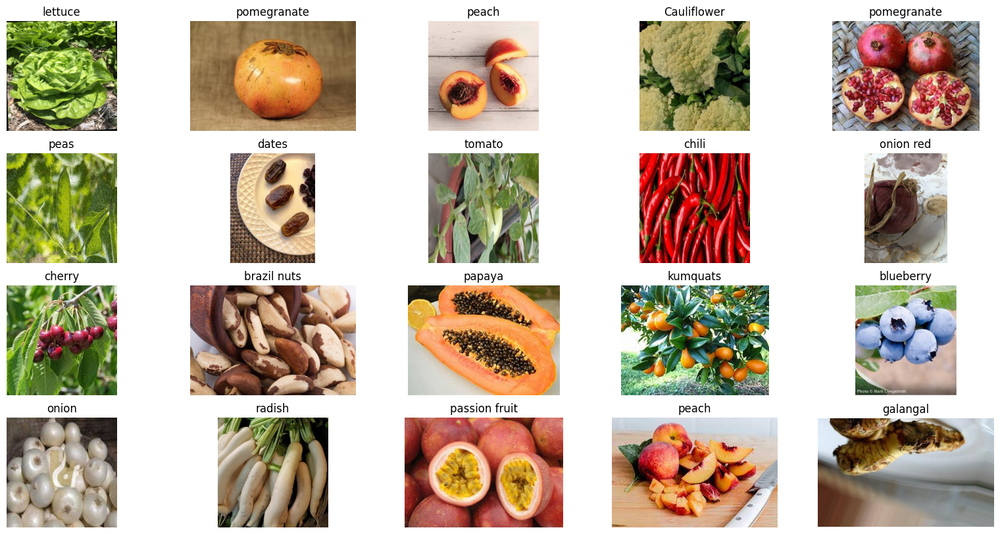

In [ ]:
# Function to display 20 random images with their class labels
def display_random_images(train_data_dir, num_images=20):
    # Get the list of class directories
    class_names = os.listdir(train_data_dir)

    # Initialize lists to hold image paths and labels
    image_paths = []
    labels = []

    # Traverse each class directory to gather image paths and their labels
    for class_name in class_names:
        class_dir = os.path.join(train_data_dir, class_name)
        if os.path.isdir(class_dir):
            for file_name in os.listdir(class_dir):
                if file_name.endswith(('.png', '.jpg', '.jpeg')):  # Check for valid image file extensions
                    image_paths.append(os.path.join(class_dir, file_name))
                    labels.append(class_name)

    # Randomly select `num_images` images and their labels
    selected_indices = random.sample(range(len(image_paths)), num_images)
    selected_image_paths = [image_paths[i] for i in selected_indices]
    selected_labels = [labels[i] for i in selected_indices]

    # Display the images with their labels
    plt.figure(figsize=(20, 10))
    for i in range(num_images):
        plt.subplot(4, 5, i+1)  # 4 rows, 5 columns
        img = mpimg.imread(selected_image_paths[i])
        plt.imshow(img)
        plt.title(selected_labels[i])
        plt.axis('off')
    plt.show()

# Call the function to display 20 random images with their class labels
display_random_images(train_data_dir)

<a id="model"></a>
<h2><b><span style="color:#005f26">🔶 Step 3 | </span><span style="color:#ff6200">Modelling</span></b></h2>

<a id="prepare model"></a>
<h2><b><span style="color:#005f26">3.1 | </span><span style="color:#ff6200">Preparing the Model</span></b></h2>

In [81]:
# Load the pre-trained Xception without the top layer (include_top = False)
base_model_xception = tf.keras.applications.Xception(weights="imagenet", include_top=False, input_shape=(300, 300, 3))

In [ ]:
# Freeze the base model layers
for layer in base_model_xception.layers:
    layer.trainable = False

In [ ]:
# Build a model
sequential_model = tf.keras.models.Sequential([
    base_model_xception,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1024, activation="relu"),
    tf.keras.layers.Dense(num_class, activation="softmax")
])

sequential_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 10, 10, 2048)      20861480  
                                                                 
 flatten_2 (Flatten)         (None, 204800)            0         
                                                                 
 dense_4 (Dense)             (None, 1024)              209716224 
                                                                 
 dense_5 (Dense)             (None, 66)                67650     
                                                                 
Total params: 230645354 (879.84 MB)
Trainable params: 209783874 (800.26 MB)
Non-trainable params: 20861480 (79.58 MB)
_________________________________________________________________


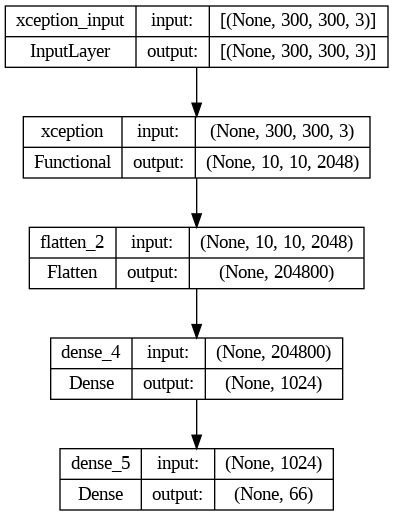

In [ ]:
# Save the model architecture as an image
plot_model(sequential_model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Compile model
sequential_model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

<a id="training"></a>
<h2><b><span style="color:#005f26">3.2 | </span><span style="color:#ff6200">Training the Model</span></b></h2>

In [ ]:
# Model training
history = sequential_model.fit(
      train_generator,
      epochs=50,
      verbose=1,
      validation_data = validation_generator,
)

Epoch 1/50
105/319 [========>.....................] - ETA: 12:09 - loss: 8.3800 - accuracy: 0.4209

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


319/319 [==============================] - 1247s 4s/step - loss: 3.7130 - accuracy: 0.5659 - val_loss: 0.9987 - val_accuracy: 0.7277
Epoch 2/50
319/319 [==============================] - 1195s 4s/step - loss: 1.1197 - accuracy: 0.6994 - val_loss: 0.8578 - val_accuracy: 0.7603
Epoch 3/50
319/319 [==============================] - 1163s 4s/step - loss: 0.9719 - accuracy: 0.7306 - val_loss: 0.8136 - val_accuracy: 0.7764
Epoch 4/50
319/319 [==============================] - 1193s 4s/step - loss: 0.8857 - accuracy: 0.7522 - val_loss: 0.7768 - val_accuracy: 0.7901
Epoch 5/50
319/319 [==============================] - 1173s 4s/step - loss: 0.8123 - accuracy: 0.7702 - val_loss: 0.7515 - val_accuracy: 0.7997
Epoch 6/50
319/319 [==============================] - 1155s 4s/step - loss: 0.7862 - accuracy: 0.7802 - val_loss: 0.7211 - val_accuracy: 0.7989
Epoch 7/50
319/319 [==============================] - 1157s 4s/step - loss: 0.7491 - accuracy: 0.7854 - val_loss: 0.7527 - val_accuracy: 0.7987
Epo

<a id="evaluate"></a>
<h3><b><span style="color:#005f26">3.2.1 | </span><span style="color:#ff6200">Evaluation of Training Results</span></b></h3>

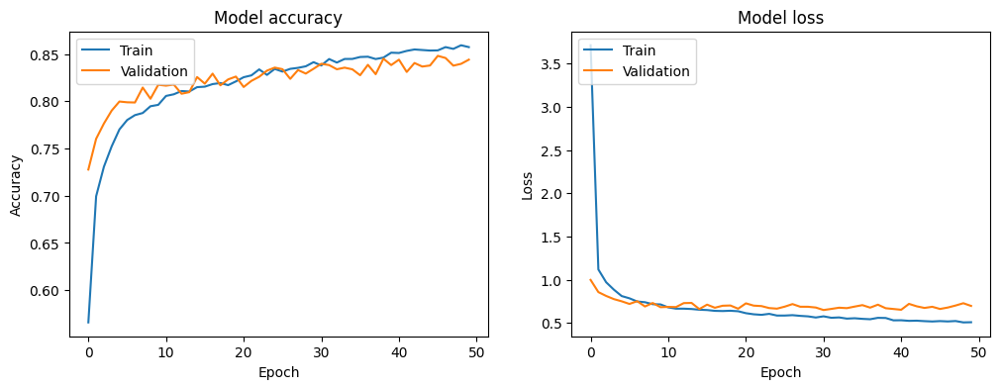

In [85]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [86]:
# Retrieve logs of stored training
training_log = history.history

# Retrieve the final values of accuracy and loss
final_accuracy = training_log['accuracy'][-1]
final_loss = training_log['loss'][-1]

# Show final value
print(f'Accuracy: {final_accuracy:.4f}')
print(f'Loss: {final_loss:.4f}')

Accuracy: 0.8574
Loss: 0.5094


<a id="save"></a>
<h3><b><span style="color:#005f26">3.2.2 | </span><span style="color:#ff6200">Save Model & Metadata</span></b></h3>

In [87]:
# Save the model in HDF5 format
sequential_model.save('fv_model.h5')

In [88]:
# Save the label in json
with open('metadata.json', 'w') as fp:
    json.dump(list(train_generator.class_indices.keys()), fp)

<a id="evaluate"></a>
<h2><b><span style="color:#005f26">🔶 Step 4 | </span><span style="color:#ff6200">Model Evaluation (Classification)</span></b></h2>

In [105]:
# Load model
sequential_model = load_model('fv_model.h5')

1/1 [==============================] - 0s 39ms/step


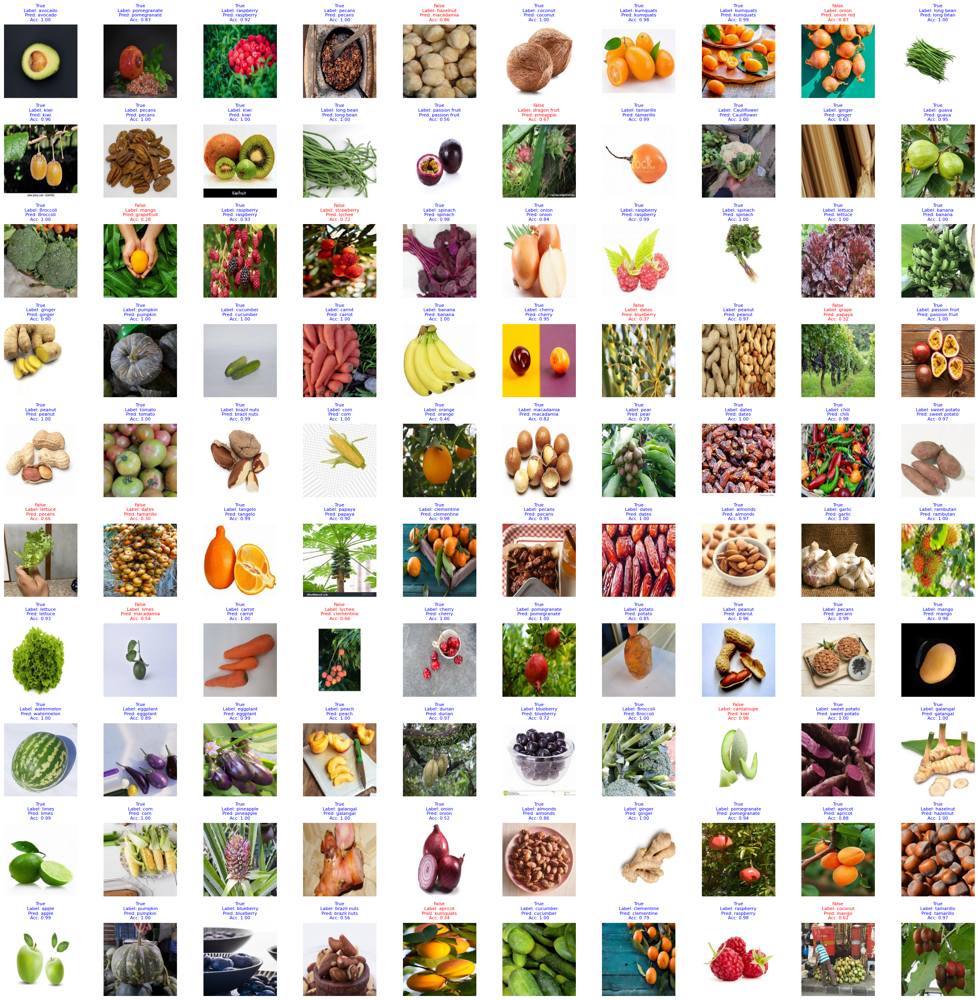

In [106]:
# Randomly select images
random_indices = random.sample(range(len(test_generator.filenames)), 100)

row = 10
col = 10

plt.figure(figsize=(col*2.5, row*2.5))

label_indices = [k for k, v in test_generator.class_indices.items()]

for i, index in enumerate(random_indices):
    # Load image and preprocessing
    img_path = os.path.join(test_data_dir, test_generator.filenames[index])
    img = load_img(img_path, target_size=(300, 300))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # label_indices = [k for k, v in test_generator.class_indices.items()]

    # Image prediction
    prediction = sequential_model.predict(img_array)
    prediction_label_index = np.argmax(prediction)
    predicted_label = label_indices[prediction_label_index]

    # Original label
    true_label = test_generator.filenames[index].split('/')[0]

    # Display image with label
    plt.subplot(row, col, i + 1)
    plt.imshow(img)

    if predicted_label == true_label:
        plt.title(f"True\nLabel: {true_label}\nPred: {predicted_label}\nAcc: {prediction[0][prediction_label_index]:.2f}", color="blue", fontsize=8)
    else:
        plt.title(f"False\nLabel: {true_label}\nPred: {predicted_label}\nAcc: {prediction[0][prediction_label_index]:.2f}", color="red", fontsize=8)

    plt.axis('off')

plt.tight_layout()
plt.show()

Saving kiwi.jpeg to kiwi.jpeg
1/1 [==============================] - 0s 24ms/step


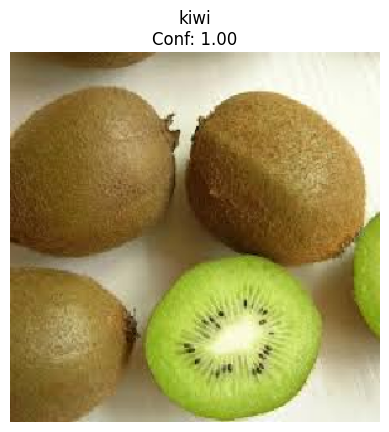

In [107]:
# Upload images
uploaded = files.upload()

for fn in uploaded.keys():
    # Predicting images
    path = '/content/' + fn
    img = utils.load_img(path, target_size=(300, 300))
    x = utils.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0  # Normalize the image

    # Predict
    predictions = sequential_model.predict(x, batch_size=10)
    confidence = np.max(predictions[0])
    predicted_label_index = np.argmax(predictions[0])

    plt.imshow(img)
    if confidence < 0.9:
        plt.title(f"Unknown\nConf: {confidence:.2f}")
    else:
        predicted_label = labels[predicted_label_index]
        plt.title(f"{predicted_label}\nConf: {confidence:.2f}")
    plt.axis('off')
    plt.show()

Saving dog.png to dog (1).png
1/1 [==============================] - 0s 27ms/step


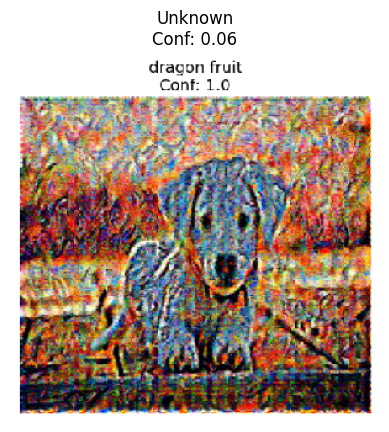

In [108]:
# Upload images
uploaded = files.upload()

for fn in uploaded.keys():
    # Predicting images
    path = '/content/' + fn
    img = utils.load_img(path, target_size=(300, 300))
    x = utils.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0  # Normalize the image

    # Predict
    predictions = loaded_model.predict(x, batch_size=10)
    confidence = np.max(predictions[0])
    predicted_label_index = np.argmax(predictions[0])

    plt.imshow(img)
    if confidence < 0.9:
        plt.title(f"Unknown\nConf: {confidence:.2f}")
    else:
        predicted_label = labels[predicted_label_index]
        plt.title(f"{predicted_label}\nConf: {confidence:.2f}")
    plt.axis('off')
    plt.show()

In [114]:
# Download model
files.download('fv_model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>